# EUR-USD Analysis

## Preprocessing and Benchmarking

In [1]:
from eda import *
from models_utils import *
import math
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from cycler import cycler
import pygam
from pygam import LinearGAM, s
import numpy as np
import warnings
from nixtlats import TimeGPT
from statsmodels.tsa.seasonal import seasonal_decompose, STL

warnings.filterwarnings('ignore')

plt.rcParams['axes.prop_cycle'] = cycler(color=plt.cm.tab20.colors)

### Train / Val / Test split

In [3]:
currency = "EURUSD=X"
train_df, val_df, test_df = load_train_val_test_data(
    file_name='exchange_v2.csv', 
    currency=currency,
    sizes=(0.80, 0.10, 0.10)
)

#train_df['Close'].plot()
#val_df['Close'].plot()
#test_df['Close'].plot()

#plt.ylabel(f"{currency} Price")
#plt.title("Train/Val/Test Split")

# Add a new column to each dataframe to indicate the dataset type
train_df['Dataset'] = 'Train'
val_df['Dataset'] = 'Validation'
test_df['Dataset'] = 'Test'

# Concatenate the dataframes
combined_df = pd.concat([train_df, val_df, test_df])

# Create a single chart with a color encoding based on the dataset type
chart = alt.Chart(combined_df).mark_line(strokeWidth=1).encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[combined_df['Close'].min() - 0.05, combined_df['Close'].max() + 0.05])),
    color='Dataset:N'
).properties(
    width=800,
    height=300,
    title=f"{currency} Exchange Rate: Train/Validation/Test Split"
)

chart.save('graphs/eurusd/a_train_validation_test_split.json')
chart

alt.Chart(...)

### Calculate the benchmark models

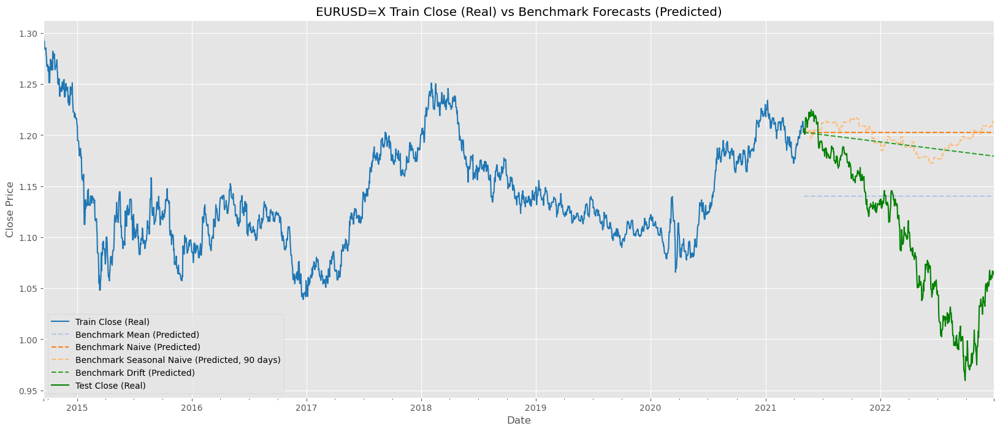

In [3]:
train_df, charts = preprocess(train_df, windows=(1, 3, 7, 30, 90, 365))
train_df, val_df = calc_benchmarks(train_df, val_df, seasonality=90)

In [5]:
def to_altair(df_train, df_test):
    # Prepare the data: Add a new column for each series as an identifier
    df_train['Series'] = 'Train Close (Real)'
    df_test['Series'] = 'Test Close (Real)'
    df_test['bench_mean_Close_Series'] = 'Benchmark Mean (Predicted)'
    df_test['bench_naive_Close_Series'] = 'Benchmark Naive (Predicted)'
    df_test['bench_seasonal_naive_Close_Series'] = f'Benchmark Seasonal Naive (Predicted, 90 days)'
    df_test['bench_drift_Close_Series'] = 'Benchmark Drift (Predicted)'

    # Combine dataframes
    combined_df = pd.concat([
        df_train[['Close', 'Series']],
        df_test[['Close', 'Series']],
        df_test[['bench_mean_Close', 'bench_mean_Close_Series']].rename(columns={'bench_mean_Close': 'Close', 'bench_mean_Close_Series': 'Series'}),
        df_test[['bench_naive_Close', 'bench_naive_Close_Series']].rename(columns={'bench_naive_Close': 'Close', 'bench_naive_Close_Series': 'Series'}),
        df_test[['bench_seasonal_naive_Close', 'bench_seasonal_naive_Close_Series']].rename(columns={'bench_seasonal_naive_Close': 'Close', 'bench_seasonal_naive_Close_Series': 'Series'}),
        df_test[['bench_drift_Close', 'bench_drift_Close_Series']].rename(columns={'bench_drift_Close': 'Close', 'bench_drift_Close_Series': 'Series'})
    ])

    # Create a chart
    chart = alt.Chart(combined_df).mark_line().encode(
        x='index:T',  # Assuming 'index' is the date column. Replace with your actual date column name
        y='Close:Q',
        color='Series:N',
        strokeDash='Series:N'
    ).properties(
        width=1000,
        height=400,
        title=f'{currency} Train Close (Real) vs Benchmark Forecasts (Predicted)'
    )
    return chart

chart = to_altair(train_df, val_df)
chart

KeyError: "['bench_mean_Close'] not in index"

Text(0.5, 1.0, 'Benchmark Residuals Plot')

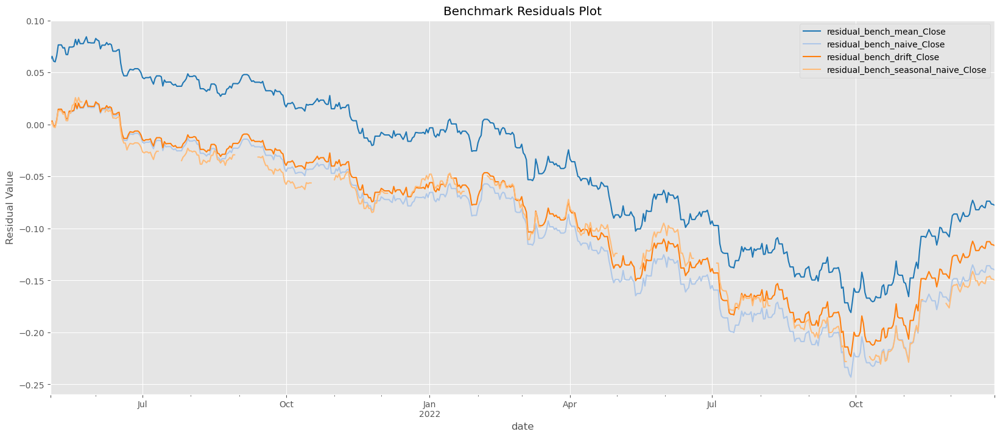

In [716]:
# List of benchmark columns
benchmark_cols = ['bench_mean_Close', 'bench_naive_Close', 
                  'bench_drift_Close', 'bench_seasonal_naive_Close']

# Calculate residuals and store in a new DataFrame
residuals_df = pd.DataFrame()

for col in benchmark_cols:
    residuals_df[f'residual_{col}'] = val_df['Close'] - val_df[col]
    
residuals_df.plot()

plt.ylabel("Residual Value")
plt.title("Benchmark Residuals Plot")

In [189]:
benchmark_metrics = calculate_forecast_metrics(val_df, actual_col='Close', benchmark_cols=benchmark_cols)
benchmark_metrics

,bench_mean_Close,bench_naive_Close,bench_drift_Close,bench_seasonal_naive_Close
MAE,0.066929,0.103038,0.091484,0.098029
MSE,0.006774,0.015494,0.012391,0.013762
RMSE,0.082306,0.124477,0.111316,0.117311
MAPE,6.337254,9.818557,8.725692,9.325902
R2,-0.287162,-1.944081,-1.354444,-1.614851


### Other charts of interest

In [190]:
for chart in charts:
    chart.display()

/usr/local/anaconda3/envs/ts/lib/python3.11/site-packages/altair/utils/core.py:283: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

alt.LayerChart(...)

## Autocorrelations

### Simple autocorrelation on Close

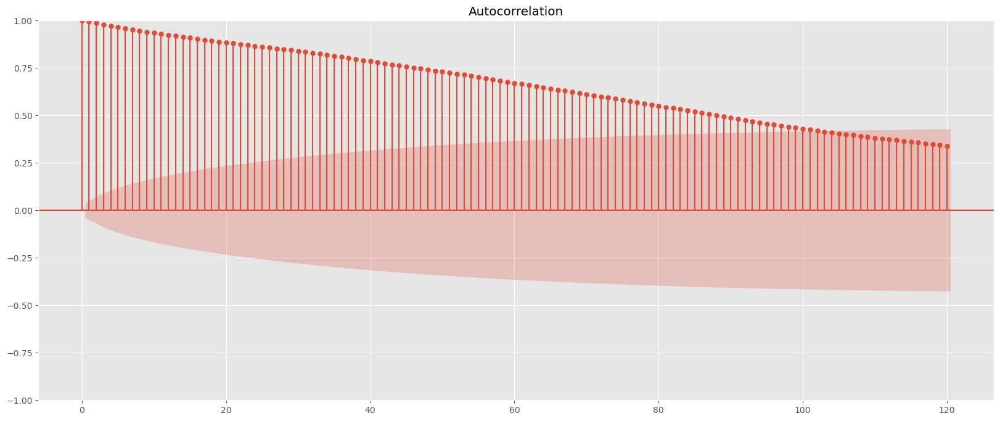

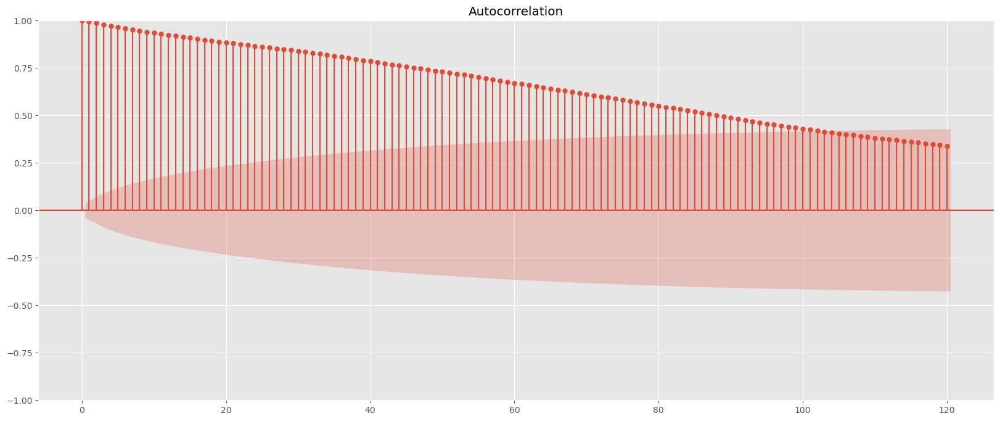

In [339]:
plot_acf((train_df['Close']).dropna(), lags=120)

### Autocorrelation on 1st order differenciation (1 day)

This graph shows that calculating the 1st order differenciation of $y'_t = y_t - y_{t-1}$ is already a white-noise process.

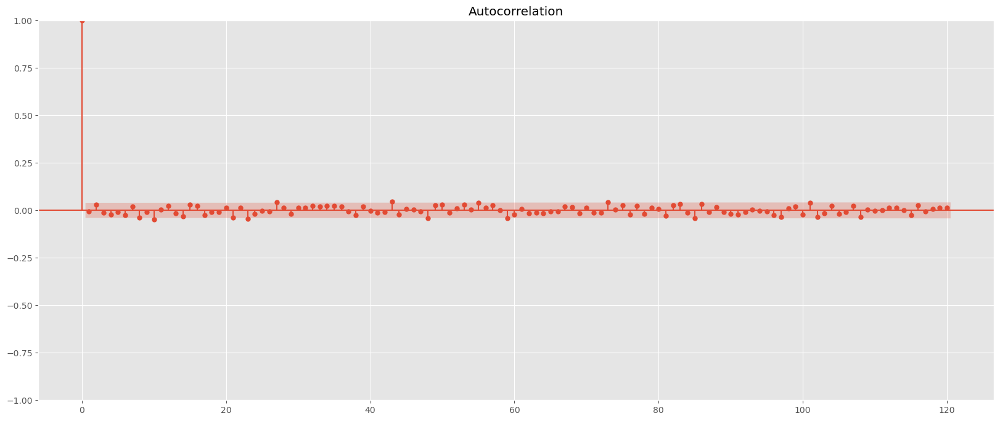

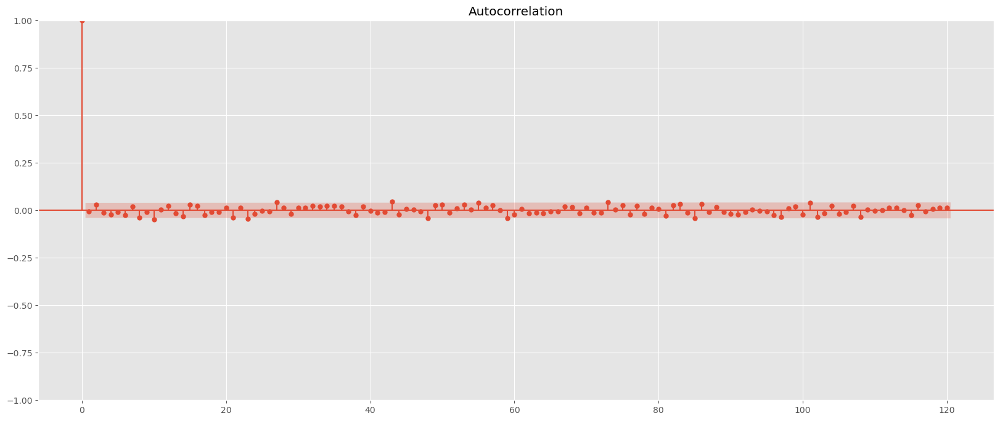

In [347]:
plot_acf((train_df['Close']-train_df['Close'].shift(1)).dropna(), lags=120)

### Partial Autocorrelation at Close

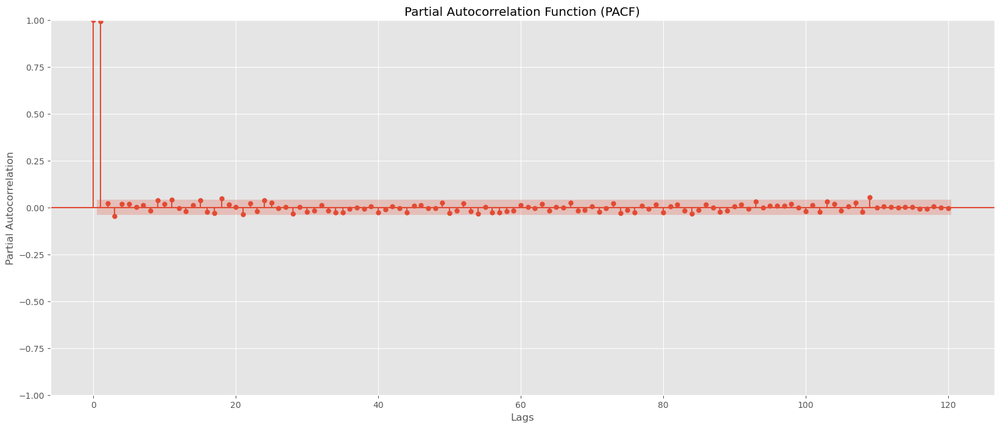

In [104]:
plot_pacf(train_df['Close'], lags=120)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lags')
plt.ylabel('Partial Autocorrelation')
plt.show()

## Models

### Momentum Model with rolling window

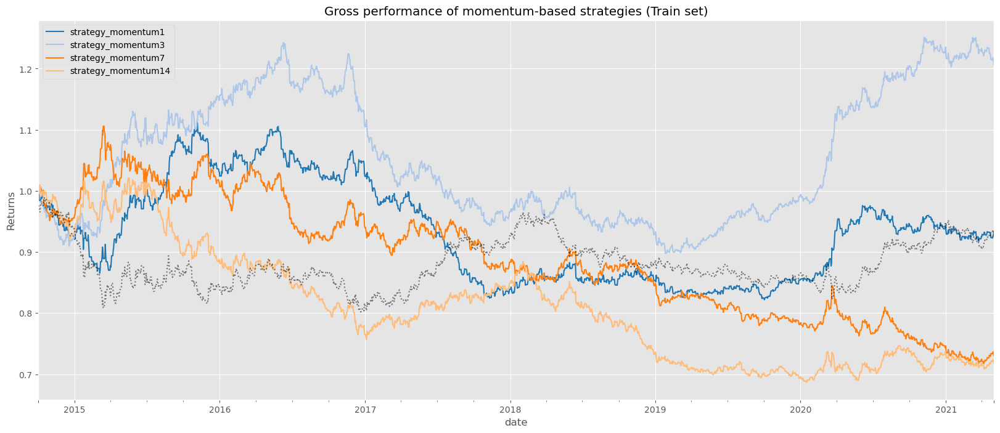

In [583]:
def strategy_momentum(df, momentum, feature='Close'):
    df[f'daily_returns'] = np.log(df[feature] / df[feature].shift(1))
    position = np.sign(df[f'daily_returns'].rolling(momentum).mean())
    df[f'strategy_momentum{momentum}'] = (position.shift(1) * df['daily_returns'])
    return df

for i in [1, 3, 7, 14]:
    train_df = strategy_momentum(train_df, i)

mom_cols = [f'strategy_momentum{mom}' for mom in [1, 3, 7, 14]]

train_df[mom_cols].dropna().cumsum().apply(np.exp).plot()
plt.plot(train_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', alpha=0.5, label='Actual Returns', linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of momentum-based strategies (Train set)")
plt.show()

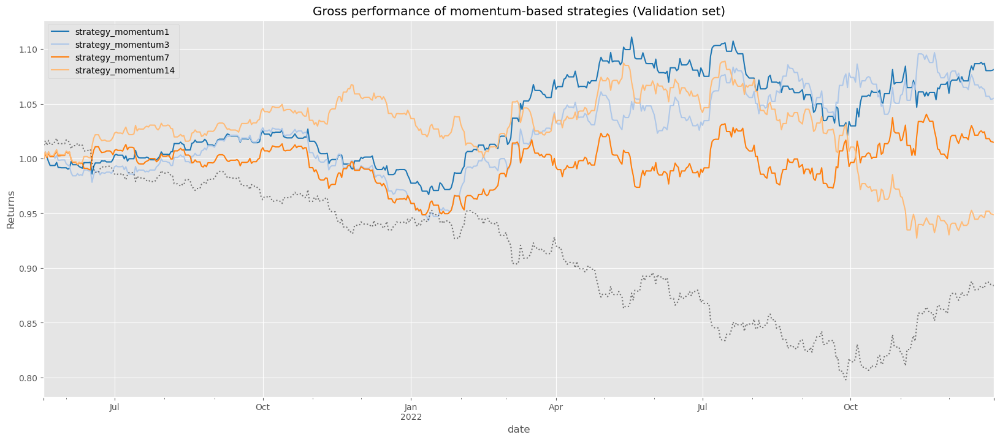

In [587]:
for i in [1, 3, 7, 14]:
    val_df = strategy_momentum(val_df, i)

mom_cols = [f'strategy_momentum{mom}' for mom in [1, 3, 7, 14]]

val_df[mom_cols].dropna().cumsum().apply(np.exp).plot()
plt.plot(val_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', alpha=0.5, label='Actual Returns', linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of momentum-based strategies (Validation set)")
plt.show()

In [588]:
mom_cols.append('daily_returns')
val_df[mom_cols].dropna().cumsum().apply(np.exp).iloc[-1], len(val_df)

(strategy_momentum1     1.081366
 strategy_momentum3     1.055117
 strategy_momentum7     1.014451
 strategy_momentum14    0.948421
 daily_returns          0.874809
 Name: 2022-12-29 00:00:00, dtype: float64,
 606)

### ARIMA (AR, MA, ARMA, AND ARIMA)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


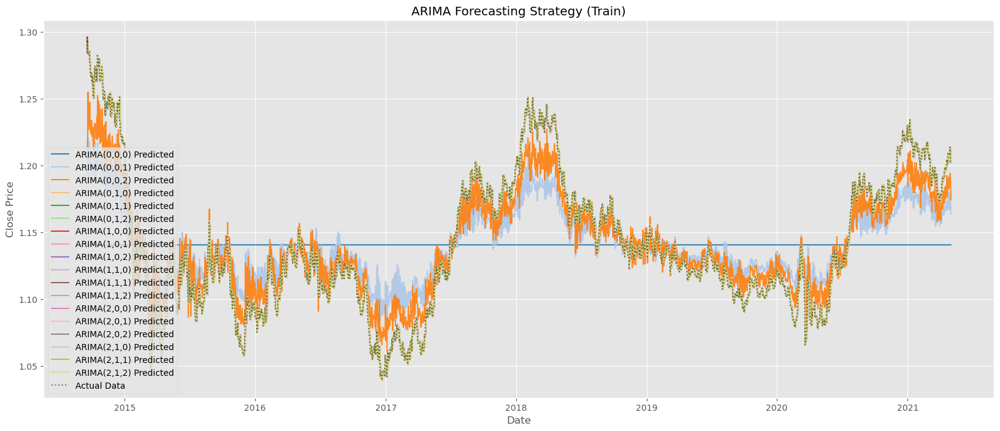

In [743]:
def strategy_arima_forecasting(df, ar_order=1, i_order=0, ma_order=1, feature='Close', model_fit=None, trade_freq='1D'):
    df = df.asfreq(trade_freq)
    df_copy = df.copy()

    if model_fit is None:
        model_fit = ARIMA(df_copy[feature], order=(ar_order, i_order, ma_order)).fit()

    # Determine the correct start point for the prediction
    start_point = max((ar_order, ma_order, i_order))

    predictions = model_fit.predict(start=start_point, end=len(df_copy)-1, dynamic=False)

    # Reset indices to align the data
    df_copy = df_copy.reset_index(drop=True)
    predictions_reset = predictions.reset_index(drop=True)
    
    df_copy[f'daily_returns'] = np.log(df_copy[feature] / df_copy[feature].shift(1))
    
    # Compare predicted value with previous actual value, with aligned indices
    df_copy['position'] = np.sign(predictions_reset - df_copy[feature].shift(1))

    # Strategy returns based on the positions and predicted returns
    df_copy[f'strategy_arima{ar_order}_{i_order}_{ma_order}'] = (df_copy['position'].shift(1) * df_copy['daily_returns'])
    
    # Restore the original index
    df_copy.index = df.index
    predictions_reset.index = predictions.index
    
    return df_copy, model_fit, predictions_reset


models = []
arima_combinations = [(ar, i, ma) for ar in range(0,3) for i in [0,1] for ma in range(0,3)]  # Different combinations of AR and MA orders
#ar_ma_combinations = [
#    (0, 1), (0, 3), (0, 7),
#    (1, 1), (1, 3), (1, 7),
#    (3, 1), (3, 3), (3, 7),
#    (7, 1), (7, 3), (7, 7),
#    (1, 0), (3, 0), (7, 0)
#]  # Different combinations of AR and MA orders

for ar_order, i_order, ma_order in arima_combinations:
    train_df, model_arima, predictions_arima = strategy_arima_forecasting(train_df, ar_order=ar_order, i_order=i_order, ma_order=ma_order, feature='Close')

    # Calculate the starting index for plotting
    start_index_for_plot = max((ar_order, ma_order, i_order))

    plt.plot(train_df.index[start_index_for_plot:], predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)
    models.append(model_arima)

plt.plot(train_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA Forecasting Strategy (Train)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


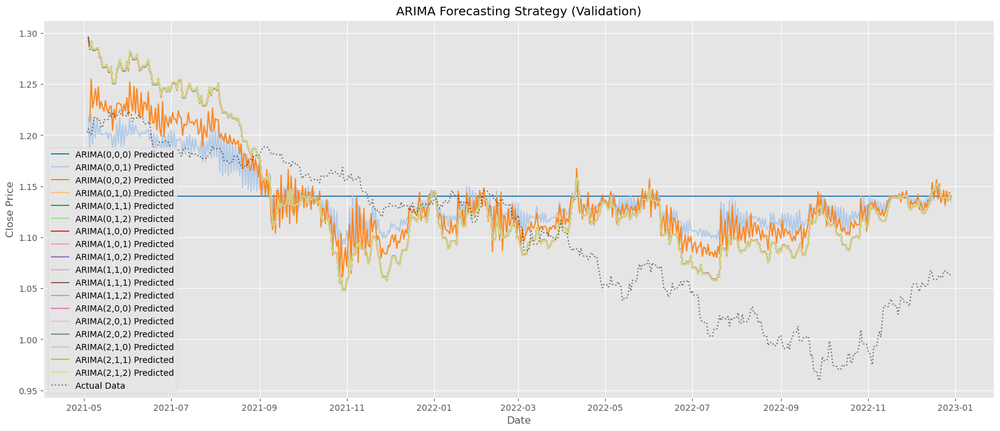

In [744]:
for (ar_order, i_order, ma_order), model in zip(arima_combinations, models):
    val_df, _, predictions_arima = strategy_arima_forecasting(val_df, ar_order=ar_order, i_order=i_order, ma_order=ma_order, feature='Close', model_fit=model)
    
    # Calculate the starting index for plotting
    start_index_for_plot = max((ar_order, ma_order, i_order))
    
    plt.plot(val_df.index[start_index_for_plot:], predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)

plt.plot(val_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA Forecasting Strategy (Validation)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

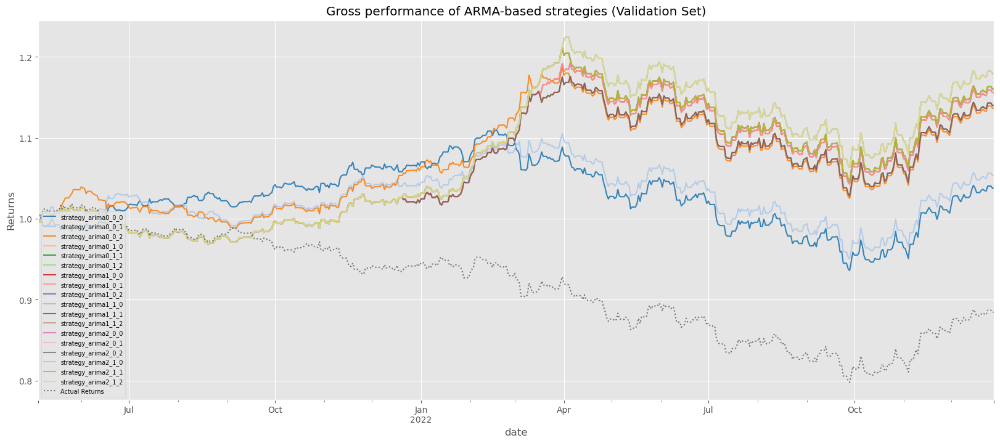

In [745]:
arima_cols = [f'strategy_arima{ar}_{i}_{ma}' for ar,i, ma in arima_combinations]

# Plotting
val_df[arima_cols].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(val_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of ARMA-based strategies (Validation Set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [746]:
val_df[arma_cols].dropna().cumsum().apply(np.exp).iloc[-1].sort_values(ascending=False), len(val_df)

(strategy_arima2_1_2    1.178761
 strategy_arima1_1_2    1.178761
 strategy_arima2_1_0    1.178761
 strategy_arima0_1_2    1.178761
 strategy_arima2_1_1    1.159938
 strategy_arima2_0_2    1.159938
 strategy_arima1_0_2    1.159938
 strategy_arima2_0_1    1.159938
 strategy_arima2_0_0    1.159938
 strategy_arima1_0_0    1.155713
 strategy_arima1_0_1    1.155713
 strategy_arima1_1_0    1.139617
 strategy_arima1_1_1    1.139617
 strategy_arima0_1_1    1.139617
 strategy_arima0_1_0    1.139617
 strategy_arima0_0_2    1.136128
 strategy_arima0_0_1    1.053205
 strategy_arima0_0_0    1.037427
 Name: 2022-12-28 00:00:00, dtype: float64,
 606)

In [747]:
arima_metrics = calculate_forecast_metrics(val_df.dropna(), actual_col='Close', benchmark_cols=arima_cols)
arima_metrics

,strategy_arima0_0_0,strategy_arima0_0_1,strategy_arima0_0_2,strategy_arima0_1_0,strategy_arima0_1_1,strategy_arima0_1_2,strategy_arima1_0_0,strategy_arima1_0_1,strategy_arima1_0_2,strategy_arima1_1_0,strategy_arima1_1_1,strategy_arima1_1_2,strategy_arima2_0_0,strategy_arima2_0_1,strategy_arima2_0_2,strategy_arima2_1_0,strategy_arima2_1_1,strategy_arima2_1_2
MAE,1.101349,1.101324,1.101198,1.101193,1.101193,1.101137,1.101170,1.101170,1.101164,1.101193,1.101193,1.101137,1.101164,1.101164,1.101164,1.101137,1.101164,1.101137
MSE,1.218213,1.218162,1.217882,1.217881,1.217881,1.217756,1.217829,1.217829,1.217815,1.217881,1.217881,1.217756,1.217815,1.217815,1.217815,1.217756,1.217815,1.217756
RMSE,1.103727,1.103704,1.103577,1.103576,1.103576,1.103520,1.103553,1.103553,1.103547,1.103576,1.103576,1.103520,1.103547,1.103547,1.103547,1.103520,1.103547,1.103520
MAPE,99.995873,99.993454,99.982107,99.981263,99.981263,99.976232,99.979164,99.979164,99.978647,99.981263,99.981263,99.976232,99.978647,99.978647,99.978647,99.976232,99.978647,99.976232
R2,-230.694676,-230.684840,-230.631644,-230.631421,-230.631421,-230.607626,-230.621584,-230.621584,-230.618888,-230.631421,-230.631421,-230.607626,-230.618888,-230.618888,-230.618888,-230.607626,-230.618888,-230.607626


### GAMs

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


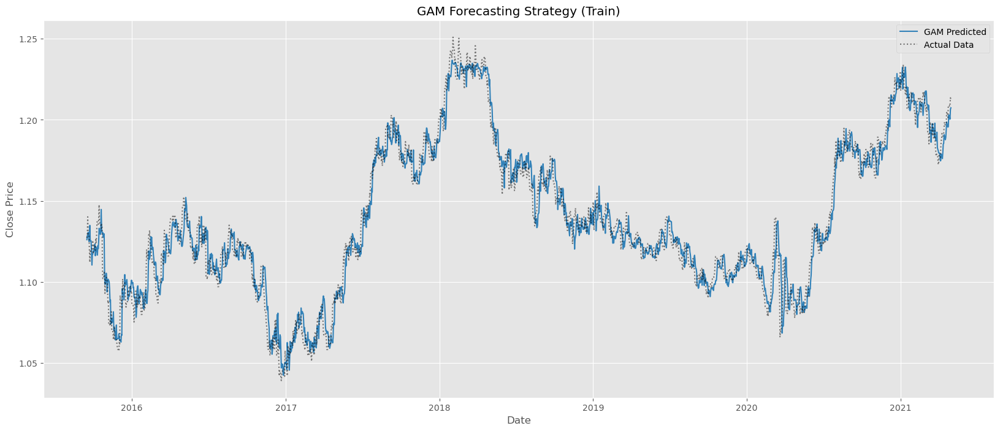

In [748]:
def strategy_gam_forecasting(df, n_days, features, target='Close', gam_model=None, trade_freq='1D'):
    """
    Fit a GAM model to the data or use an existing model to make predictions.

    :param df: DataFrame containing the data.
    :param n_days: Number of previous days to consider as a feature.
    :param target: The target variable name. Default is 'Close'.
    :param gam_model: An existing GAM model. If None, a new model will be trained.
    :return: DataFrame with predictions and the GAM model.
    """
    df = df.asfreq(trade_freq)
    df_copy = df.copy()

    # Convert date column to datetime and extract date features
    df_copy['date'] = pd.to_datetime(df_copy['date'])
    df_copy['year'] = df_copy['date'].dt.year
    df_copy['month'] = df_copy['date'].dt.month
    df_copy['day'] = df_copy['date'].dt.day
    df_copy['weekday'] = df_copy['date'].dt.weekday

    # Add lagged values of the target variable
    df_copy[f'lag_{n_days}'] = df_copy[target].shift(n_days)
    
    # Prepare the feature matrix and target vector
    features.append(f'lag_{n_days}')
    df_copy = df_copy.dropna()
    X = df_copy[features]  # Dropping rows with NA values due to lagging
    y = df_copy[target]
    
    # Fit the model if not provided
    if gam_model is None:
        # Dynamically generate the spline terms for each feature
        gam_model = LinearGAM(s(1) + s(2) + s(3) + s(4)).fit(X, y)

    # Make predictions
    predictions = gam_model.predict(X)

    # Calculate daily returns
    df_copy['daily_returns'] = np.log(df_copy[target] / df_copy[target].shift(1))

    # Generate positions based on the predictions
    df_copy['position'] = np.sign(predictions - df_copy[target].shift(1))

    # Calculate strategy returns
    df_copy['strategy_gam_returns'] = df_copy['position'].shift(1) * df_copy['daily_returns']

    return df_copy, gam_model, predictions

train_df, gam_model, predictions = strategy_gam_forecasting(train_df, n_days=5, features=['year', 'month', 'day', 'weekday'])

#train_df, gam_model, predictions = strategy_gam_forecasting(train_df, features=['year', 'month', 'day', 'weekday', 'Open', 'High', 'Low'])

plt.plot(train_df.index, predictions, label=f'GAM Predicted', alpha=0.9)

plt.plot(train_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'GAM Forecasting Strategy (Train)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

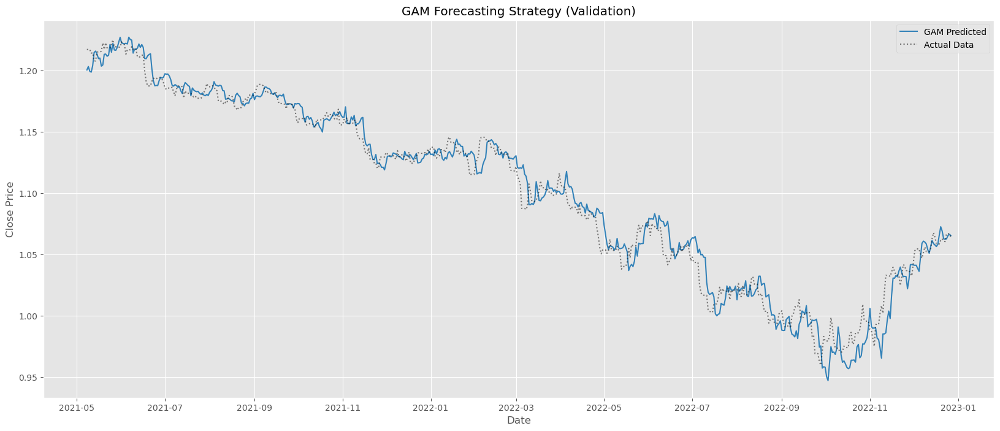

In [749]:
val_df, _, predictions = strategy_gam_forecasting(val_df, n_days=5, features=['year', 'month', 'day', 'weekday'], gam_model=gam_model)

plt.plot(val_df.index, predictions, label=f'GAM Predicted', alpha=0.9)

plt.plot(val_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'GAM Forecasting Strategy (Validation)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

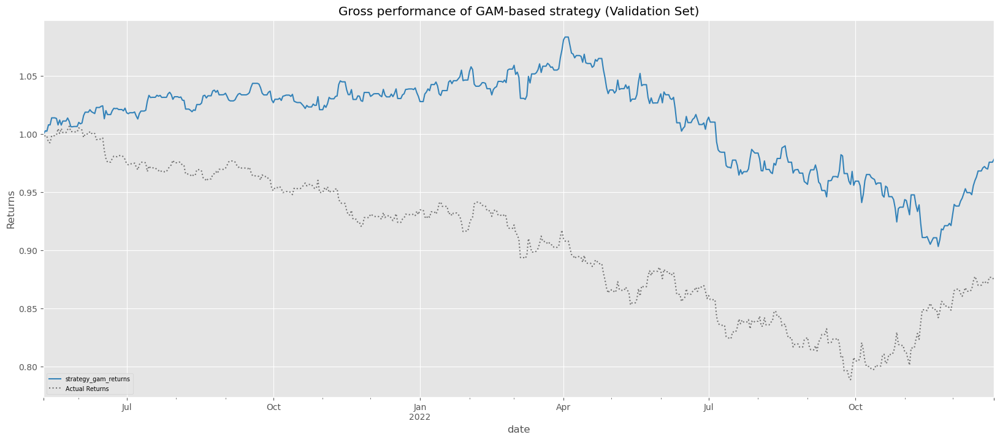

In [750]:
# Plotting
val_df['strategy_gam_returns'].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(val_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of GAM-based strategy (Validation Set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [751]:
val_df['strategy_gam_returns'].dropna().cumsum().apply(np.exp).iloc[-1], len(val_df)

(0.9780578252484933, 599)

In [752]:
gam_metrics = calculate_forecast_metrics(val_df.dropna(), actual_col='Close', benchmark_cols=['strategy_gam_returns'])
gam_metrics.T

,MAE,MSE,RMSE,MAPE,R2
strategy_gam_returns,1.100549,1.216389,1.1029,100.005255,-232.728937


## Now Try Trading Strategies based on 7-day comparisons

### ARIMA

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


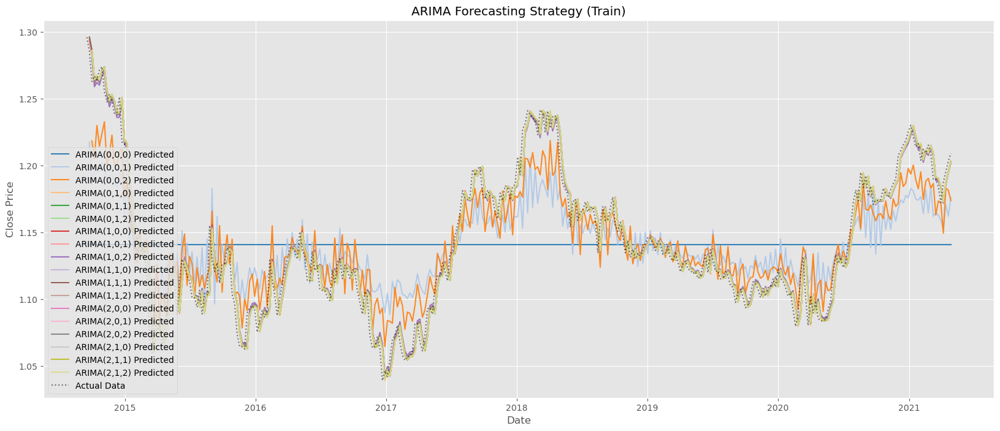

In [769]:
models = []
arima_combinations = [(ar, i, ma) for ar in range(0,3) for i in [0,1] for ma in range(0,3)]  # Different combinations of AR and MA orders
#ar_ma_combinations = [
#    (0, 1), (0, 3), (0, 7),
#    (1, 1), (1, 3), (1, 7),
#    (3, 1), (3, 3), (3, 7),
#    (7, 1), (7, 3), (7, 7),
#    (1, 0), (3, 0), (7, 0)
#]  # Different combinations of AR and MA orders

# Copy daily df into new df
train_df_arima_7D = train_df.copy()

for ar_order, i_order, ma_order in arima_combinations:
    train_df_arima_7D, model_arima, predictions_arima = strategy_arima_forecasting(train_df_arima_7D, ar_order=ar_order, i_order=i_order, ma_order=ma_order, feature='Close', trade_freq='7D')

    # Calculate the starting index for plotting
    start_index_for_plot = max((ar_order, ma_order, i_order))

    plt.plot(train_df_arima_7D.index[start_index_for_plot:], predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)
    models.append(model_arima)

plt.plot(train_df_arima_7D['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA Forecasting Strategy (Train)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

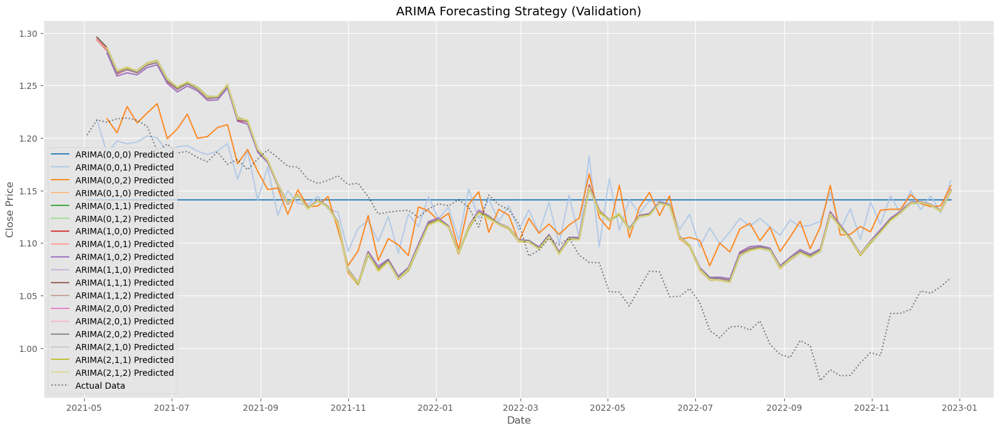

In [770]:
val_df_arima_7D = val_df.copy()

for (ar_order, i_order, ma_order), model in zip(arima_combinations, models):
    val_df_arima_7D, _, predictions_arima = strategy_arima_forecasting(val_df_arima_7D, ar_order=ar_order, i_order=i_order, ma_order=ma_order, feature='Close', model_fit=model, trade_freq='7D')
    
    # Calculate the starting index for plotting
    start_index_for_plot = max((ar_order, ma_order, i_order))
    
    plt.plot(val_df_arima_7D.index[start_index_for_plot:], predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)

plt.plot(val_df_arima_7D['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA Forecasting Strategy (Validation)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

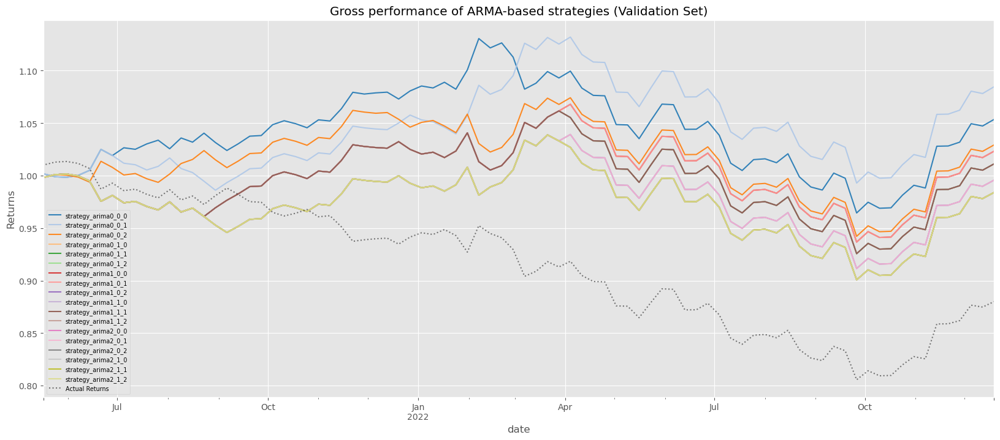

In [772]:
arima_cols = [f'strategy_arima{ar}_{i}_{ma}' for ar,i, ma in arima_combinations]

# Plotting
val_df_arima_7D[arima_cols].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(val_df_arima_7D['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of ARMA-based strategies (Validation Set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [773]:
val_df_arima_7D[arima_cols].dropna().cumsum().apply(np.exp).iloc[-1].sort_values(ascending=False), len(val_df)

(strategy_arima0_0_1    1.084655
 strategy_arima0_0_0    1.053555
 strategy_arima0_0_2    1.029269
 strategy_arima1_0_0    1.023289
 strategy_arima1_0_1    1.023289
 strategy_arima1_1_1    1.011211
 strategy_arima1_1_0    1.011211
 strategy_arima0_1_1    1.011211
 strategy_arima0_1_0    1.011211
 strategy_arima1_0_2    0.995746
 strategy_arima2_0_1    0.995746
 strategy_arima0_1_2    0.983992
 strategy_arima1_1_2    0.983992
 strategy_arima2_0_0    0.983992
 strategy_arima2_0_2    0.983992
 strategy_arima2_1_0    0.983992
 strategy_arima2_1_1    0.983992
 strategy_arima2_1_2    0.983992
 Name: 2022-12-19 00:00:00, dtype: float64,
 606)

In [774]:
arima_metrics = calculate_forecast_metrics(val_df_arima_7D.dropna(), actual_col='Close', benchmark_cols=arima_cols)
arima_metrics

,strategy_arima0_0_0,strategy_arima0_0_1,strategy_arima0_0_2,strategy_arima0_1_0,strategy_arima0_1_1,strategy_arima0_1_2,strategy_arima1_0_0,strategy_arima1_0_1,strategy_arima1_0_2,strategy_arima1_1_0,strategy_arima1_1_1,strategy_arima1_1_2,strategy_arima2_0_0,strategy_arima2_0_1,strategy_arima2_0_2,strategy_arima2_1_0,strategy_arima2_1_1,strategy_arima2_1_2
MAE,1.099940,1.099589,1.100221,1.100434,1.100434,1.100763,1.100291,1.100291,1.100620,1.100434,1.100434,1.100763,1.100763,1.100620,1.100763,1.100763,1.100763,1.100763
MSE,1.214982,1.214277,1.215721,1.216236,1.216236,1.217010,1.215920,1.215920,1.216694,1.216236,1.216236,1.217010,1.217010,1.216694,1.217010,1.217010,1.217010,1.217010
RMSE,1.102262,1.101942,1.102597,1.102831,1.102831,1.103182,1.102688,1.102688,1.103038,1.102831,1.102831,1.103182,1.103182,1.103038,1.103182,1.103182,1.103182,1.103182
MAPE,99.960781,99.926301,99.981563,99.999157,99.999157,100.027138,99.986207,99.986207,100.014189,99.999157,99.999157,100.027138,100.027138,100.014189,100.027138,100.027138,100.027138,100.027138
R2,-230.607139,-230.472760,-230.748046,-230.846314,-230.846314,-230.993753,-230.786062,-230.786062,-230.933501,-230.846314,-230.846314,-230.993753,-230.993753,-230.933501,-230.993753,-230.993753,-230.993753,-230.993753


### GAM

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


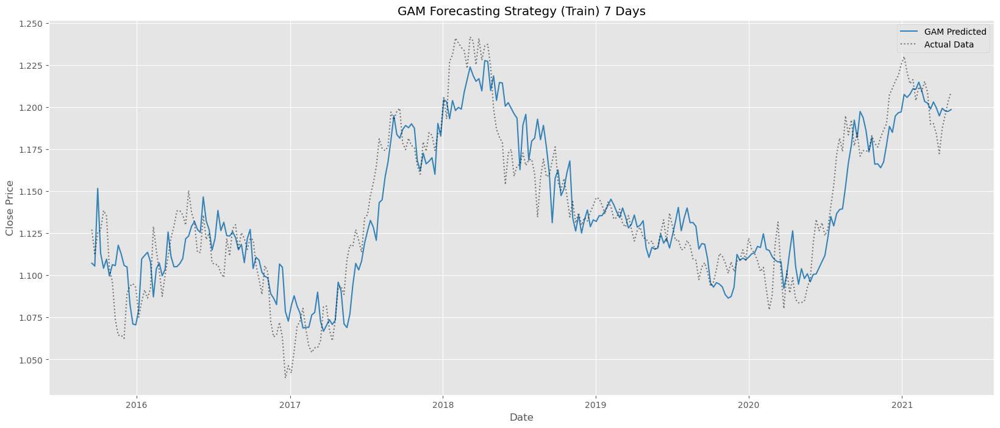

In [775]:
train_df_gam_7D = train_df.copy()

train_df_gam_7D, gam_model, predictions = strategy_gam_forecasting(train_df_gam_7D, n_days=5, features=['year', 'month', 'day', 'weekday'], trade_freq='7D')

plt.plot(train_df_gam_7D.index, predictions, label=f'GAM Predicted', alpha=0.9)

plt.plot(train_df_gam_7D['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'GAM Forecasting Strategy (Train) 7 Days')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

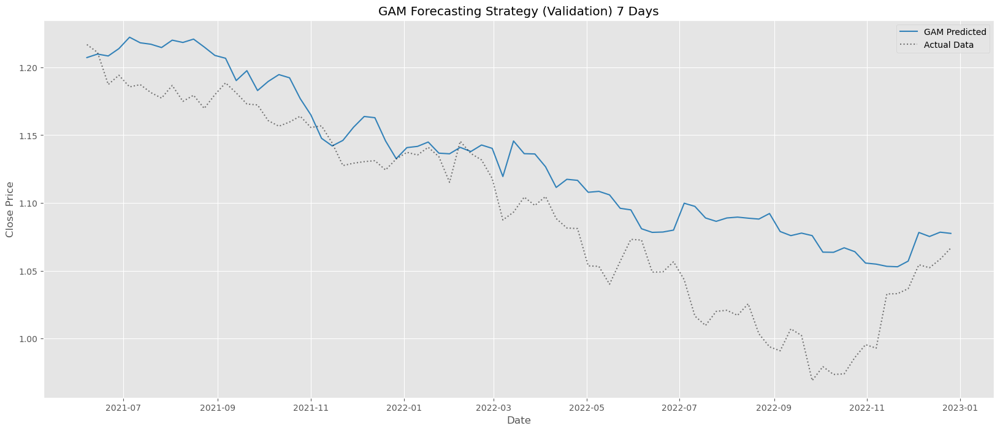

In [776]:
val_df_gam_7D = val_df.copy()

val_df_gam_7D, _, predictions = strategy_gam_forecasting(val_df_gam_7D, n_days=5, features=['year', 'month', 'day', 'weekday'], gam_model=gam_model, trade_freq='7D')

plt.plot(val_df_gam_7D.index, predictions, label=f'GAM Predicted', alpha=0.9)

plt.plot(val_df_gam_7D['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'GAM Forecasting Strategy (Validation) 7 Days')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

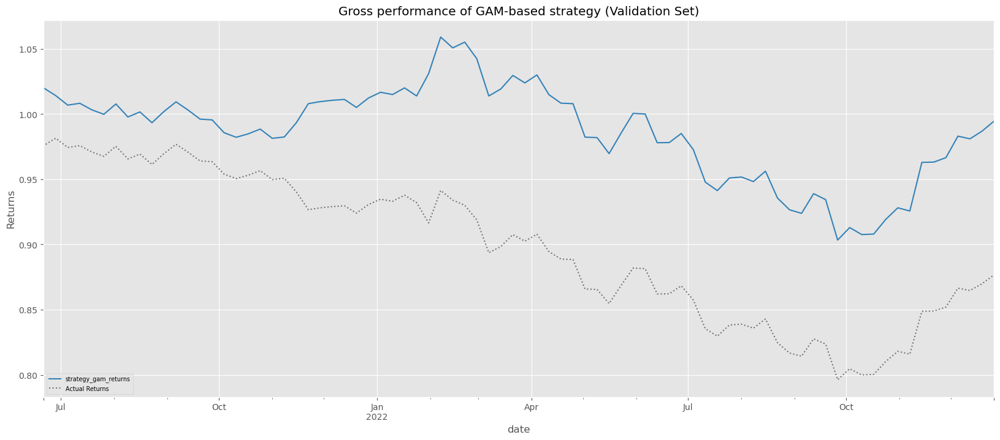

In [779]:
# Plotting
val_df_gam_7D['strategy_gam_returns'].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(val_df_gam_7D['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of GAM-based strategy (Validation Set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [780]:
val_df_gam_7D['strategy_gam_returns'].dropna().cumsum().apply(np.exp).iloc[-1], len(val_df_gam_7D)

(0.9945353968844468, 82)

In [781]:
gam_metrics = calculate_forecast_metrics(val_df_gam_7D.dropna(), actual_col='Close', benchmark_cols=['strategy_gam_returns'])
gam_metrics.T

,MAE,MSE,RMSE,MAPE,R2
strategy_gam_returns,1.092397,1.197895,1.094484,100.013247,-260.712812


## Extra Experimentation

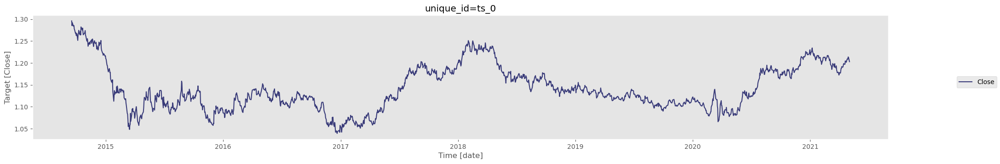

In [20]:
timegpt = TimeGPT(
    token='9M6BnvgK6y8XhTu87nl5GRIMsaOaB1hbHGebDhTuhCzhoCb8aSUnsNC2bIARMdaq1NSTE2b5LZy1GY5KBmatNg7ffmQ8Y9Se9btWJ8DrAyWcR36JEac8gvZrKRsvWOfFNHd2kXvBPMFnO3Z2K5uGnYbtYoNShMhhUOXJ5F9BEjwzvuwwDTONvLGXEhJKcqfg9Xaxt34Y08JJdZYkZNwkYANdU3mlQO6EQn59Dg3bAAE8HDIHMPfp2EWPfyzZRnX9'
)

train_df_gpt = train_df.rename_axis("dateindex")
train_df_gpt = train_df_gpt[~train_df_gpt.index.duplicated(keep='first')]
train_df_gpt = train_df_gpt[~train_df_gpt['date'].duplicated(keep='first')]
timegpt.plot(train_df_gpt, time_col='date', target_col='Close')

### Forecast without fine tuning

In [23]:
forecast_raw = timegpt.forecast(train_df_gpt, time_col='date', target_col='Close', h=606, freq='D')

INFO:nixtlats.timegpt:Validating inputs...
INFO:nixtlats.timegpt:Preprocessing dataframes...
INFO:nixtlats.timegpt:Calling Forecast Endpoint...


In [45]:
forecast_raw.set_index('date', inplace=True, drop=False)
forecast_raw['Close'] = val_df['Close'][1:]
forecast_raw

,date,TimeGPT,Close
date,,,
2021-05-04,2021-05-04,1.204295,1.206127
2021-05-05,2021-05-05,1.205436,1.201504
2021-05-06,2021-05-06,1.206303,1.200797
2021-05-07,2021-05-07,1.205992,1.206855
2021-05-08,2021-05-08,1.204815,1.217108
...,...,...,...
2022-12-26,2022-12-26,1.205854,1.066780
2022-12-27,2022-12-27,1.205904,1.064022
2022-12-28,2022-12-28,1.206118,1.063717


<AxesSubplot: xlabel='date'>

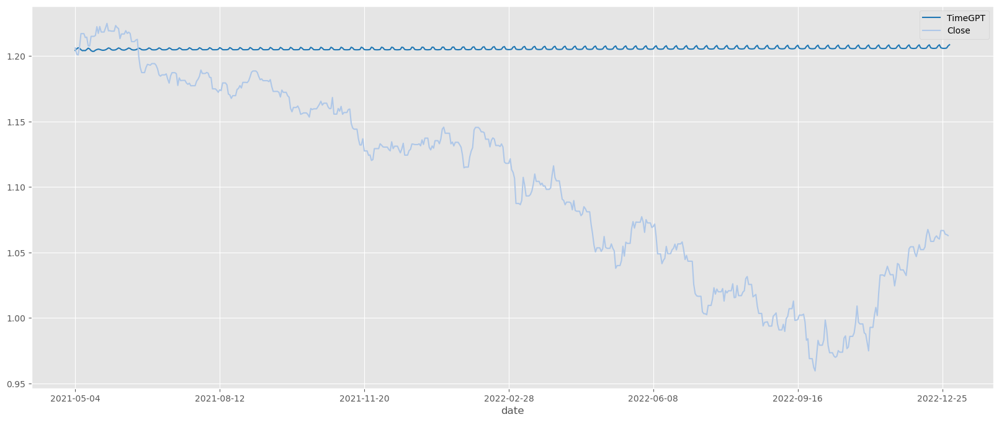

In [46]:
forecast_raw.plot(x='date')

### Forecast with fine tuning

In [47]:
forecast_finetuned = timegpt.forecast(train_df_gpt, time_col='date', target_col='Close', h=606, freq='D', finetune_steps=365)

INFO:nixtlats.timegpt:Validating inputs...
INFO:nixtlats.timegpt:Preprocessing dataframes...
INFO:nixtlats.timegpt:Calling Forecast Endpoint...


In [49]:
forecast_finetuned.set_index('date', inplace=True, drop=False)
forecast_finetuned['Close'] = val_df['Close'][1:]
forecast_finetuned

,date,TimeGPT,Close
date,,,
2021-05-04,2021-05-04,1.203360,1.206127
2021-05-05,2021-05-05,1.203300,1.201504
2021-05-06,2021-05-06,1.203305,1.200797
2021-05-07,2021-05-07,1.203700,1.206855
2021-05-08,2021-05-08,1.203617,1.217108
...,...,...,...
2022-12-26,2022-12-26,1.203549,1.066780
2022-12-27,2022-12-27,1.203550,1.064022
2022-12-28,2022-12-28,1.203551,1.063717


<AxesSubplot: xlabel='date'>

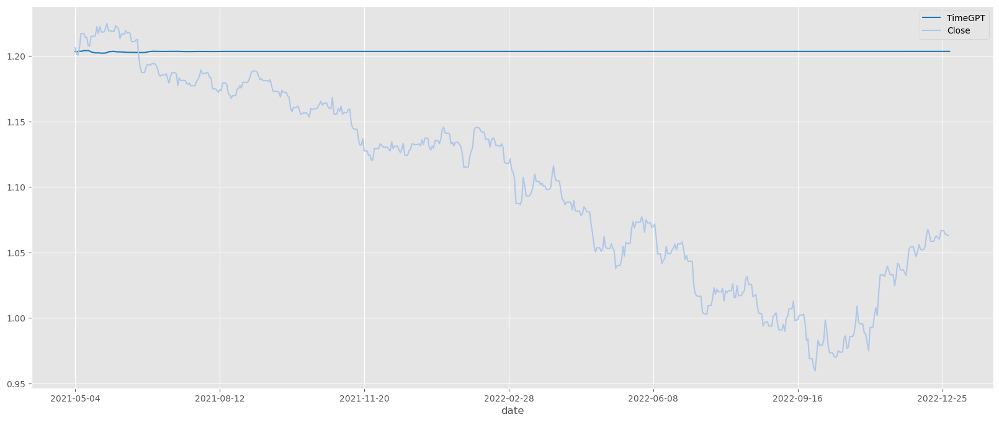

In [50]:
forecast_finetuned.plot(x='date')

## Long-Term Analysis

If we review the smoothened datasets:

In [51]:
charts[0]

alt.Chart(...)

We can only start to appreciate some sort of seasonality until we get the 365-day moving average. However, we could make use of this very smoothened version of the dataset to predict the direction of the market in the next 606 days (validation dataset).

In [85]:
stl = seasonal_decompose(train_df['Close'], extrapolate_trend='freq', period=365, model='additive')

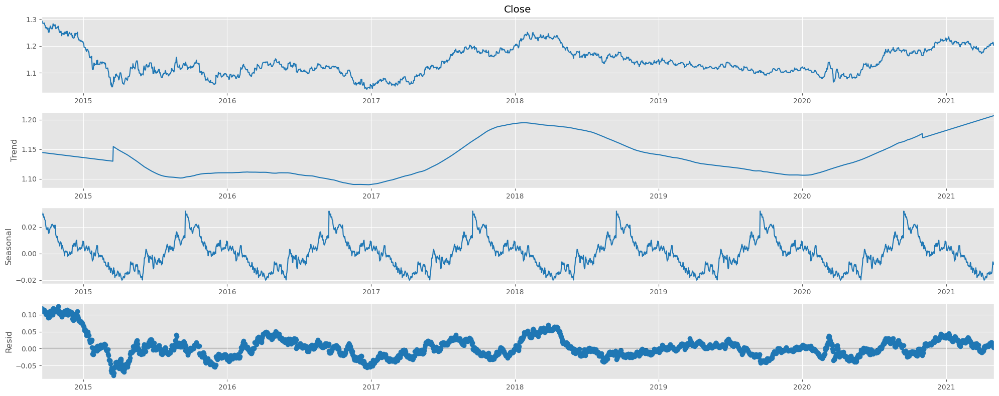

In [87]:
stl.plot()
plt.show()

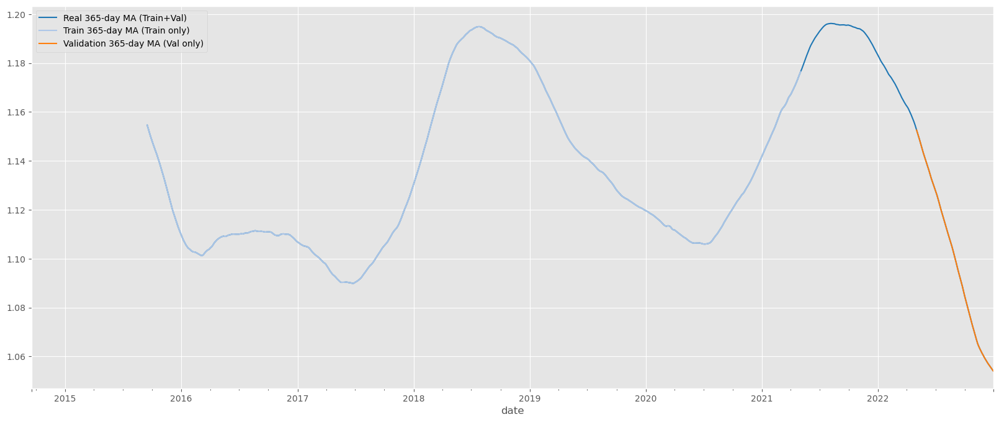

In [110]:
# Train + val 365 rolling mean
train_df['Close'].append(val_df['Close']).rolling(365).mean().plot(label='Real 365-day MA (Train+Val)')
train_df['Close'].rolling(365).mean().plot(label='Train 365-day MA (Train only)')
val_df['Close'].rolling(365).mean().plot(label='Validation 365-day MA (Val only)')
plt.title('365-day Moving Average for long term prediction')
plt.legend()

Here, the if we only look at the train data 365 MA, we can see a season starting to appear. This is enough to predict that in the short term the asset will continue to appreciate but once it hits the historical resistance level of around 1.18, it is very likely to fall down, which is what happened as we plot our validation data. Can we now predict the rise with the test data?

In [128]:
season365 = STL(train_df['Close'].rolling(365).mean().dropna(), seasonal=3).fit()

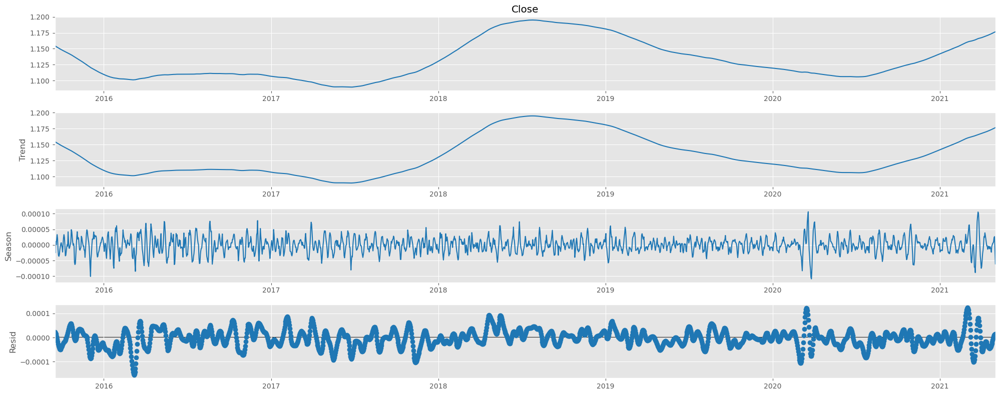

In [130]:
season365.plot()
plt.show()

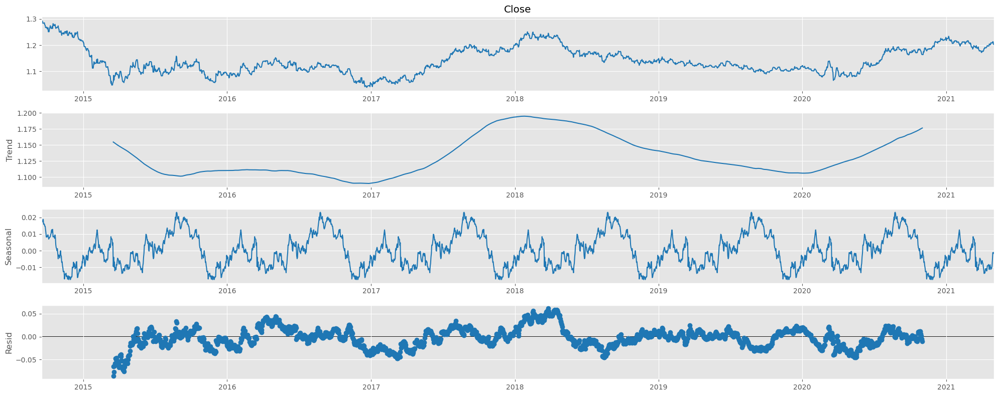

In [136]:
season365 = seasonal_decompose(train_df['Close'], period=365)
season365.plot()
plt.show()

In [153]:
train_df['Close']

date
2014-09-17    1.295908
2014-09-18    1.285000
2014-09-19    1.292006
2014-09-20    1.284142
2014-09-21    1.284142
                ...   
2021-04-28    1.209031
2021-04-29    1.213592
2021-04-30    1.212709
2021-05-01    1.202776
2021-05-02    1.202776
Freq: D, Name: Close, Length: 2420, dtype: float64

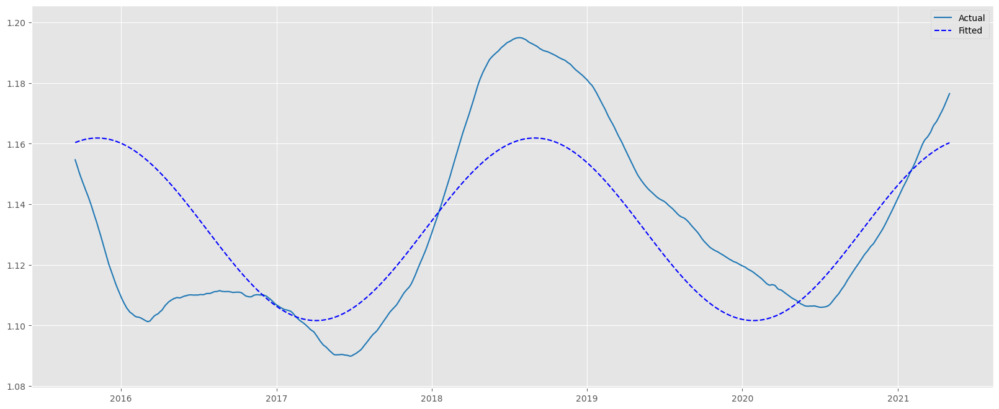

                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     972.0
Date:                Wed, 27 Dec 2023   Prob (F-statistic):          9.61e-298
Time:                        16:57:51   Log-Likelihood:                 4941.3
No. Observations:                2056   AIC:                            -9877.
Df Residuals:                    2053   BIC:                            -9860.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1317      0.000   2343.839      0.0

In [206]:
from scipy import signal
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

def fit_curve(t, y):
    # Spectrum analysis to find the period
    freqs, spec = signal.periodogram(y, fs=1)

    # Find the frequency with the maximum spectral density
    max_freq = freqs[np.argmax(spec)]
    per = 1 / max_freq

    # Fitting a linear model with the sine and cosine terms
    X = np.column_stack((np.sin(2 * np.pi * t / per), np.cos(2 * np.pi * t / per)))
    X = sm.add_constant(X)  # Add a constant term for the intercept

    model = sm.OLS(y, X).fit()
    return model


# Save the original dates before the rolling mean calculation
original_dates = train_df.index

# Calculate the rolling mean and drop NaN values
train_df_365 = train_df['Close'].rolling(365).mean().dropna()

# Reset the index after dropping NaN values
train_df_365 = train_df_365.reset_index(drop=True)

# Now, t and y should have the same number of rows
t = train_df_365.index
y = train_df_365

model = fit_curve(t, y)

# Reassign the original dates, adjusted for the dropna operation
t = original_dates[len(original_dates) - len(train_df_365):]

# Plot the actual vs fitted values
rg = np.ptp(y)  # Range of y
plt.plot(t, y, label='Actual')
plt.plot(t, model.fittedvalues, label='Fitted', color='blue', linestyle='--')  # Dashed blue line is sin fit
plt.ylim(min(y) - 0.1 * rg, max(y) + 0.1 * rg)
plt.legend()
plt.show()

# Print the summary of the regression
print(model.summary())


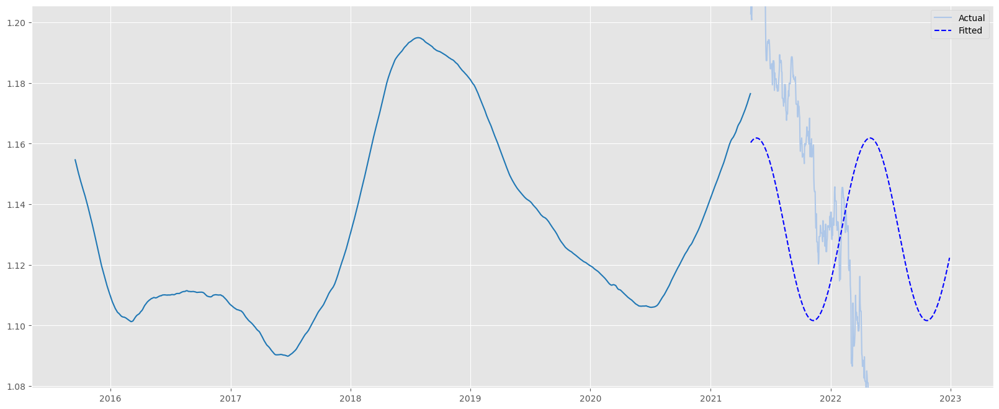

In [216]:
# Save the original dates before the rolling mean calculation
original_dates = val_df.index

def transform_data(t, y, period):
    # Transform the data into the same format as the training data
    X = np.column_stack((np.sin(2 * np.pi * t / period), np.cos(2 * np.pi * t / period)))
    X = sm.add_constant(X)  # Add a constant term for the intercept
    return X

# Assuming you have val_df['Date'] and val_df['Close'] available
val_t = val_df.reset_index(drop=True).index
val_y = val_df['Close']

# Use the period from the fitted model (if available)
# If not, you might need to calculate it again as done in fit_curve
period = 1 / freqs[np.argmax(spec)]

# Transform the validation data
val_X = transform_data(val_t, val_y, period)

# Predict using the transformed validation data
preds = model.predict(val_X)

val_t = original_dates[len(original_dates) - len(val_df):]

# Plot the actual vs fitted values
rg = np.ptp(y)  # Range of y
plt.plot(train_df.index, train_df['Close'].rolling(365).mean())
plt.plot(val_t, val_y, label='Actual')
plt.plot(val_t, preds, label='Fitted', color='blue', linestyle='--')  # Dashed blue line is sin fit
plt.ylim(min(y) - 0.1 * rg, max(y) + 0.1 * rg)
plt.legend()
plt.show()

## Saving the Charts

In [218]:
charts[0].save('graphs/demo.json')

In [219]:
charts[1].save('graphs/demo1.json')

In [220]:
charts[0]

alt.Chart(...)